<a href="https://colab.research.google.com/github/ammsenosy/AmsterdamUMCdb/blob/master/VentilAi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://github.com/AmsterdamUMC/AmsterdamUMCdb/blob/master/img/logo_c4i_square.png?raw=1" alt="Logo C4I" width=128px/>

<img src="https://github.com/AmsterdamUMC/AmsterdamUMCdb/blob/master/img/logo_amds.png?raw=1" alt="Logo AMDS" width=128px/>

# VentAi team Main Notebook



<a name="cell-project-id"></a>
# Retrieving your Google Cloud Project ID
- At the top of the screen, select **My First Project** or [create a new one](https://console.cloud.google.com/projectcreate). Please write down the Project ID in the cell below ("Insert text here") and **Run** the cell to store the value.

In [1]:
# sets *your* project id
PROJECT_ID = "datathon5-ventilai" #@param {type:"string"}

# Sets the default BigQuery dataset for accessing AmsterdamUMCdb

If you have received instructions to use a specific BigQuery instance, change the default settings here. Otherwise use these default values.

In [2]:
# sets default dataset for AmsterdamUMCdb 
DATASET_PROJECT_ID = 'amsterdamumcdb' #@param {type:"string"}
DATASET_ID = 'version1_0_2' #@param {type:"string"}
LOCATION = 'eu' #@param {type:"string"}

# Provide your credentials to access the AmsterdamUMCdb dataset on Google BigQuery
Authenticate your credentials with Google Cloud Platform and set your default Google Cloud Project ID as an environment variable for running query jobs. 

1. Run the cell. The `Allow this notebook to access your Google credentials?` prompt appears. Select `Allow`. 
2. In the `Sign in - Google Accounts` dialog, use the account you registered during the AmsterdamUMCdb application process and select `Allow` again.

In [3]:
import os
from google.colab import auth

# all libraries check this environment variable, so set it:
os.environ["GOOGLE_CLOUD_PROJECT"] = PROJECT_ID

auth.authenticate_user()
print('Authenticated')

Authenticated


# Enable data table display

Colab includes the `google.colab.data_table` package that can be used to display Pandas dataframes as an interactive data table (default limits: `max_rows = 20000`, `max_columns = 20`). This is especially useful when exploring the  tables or dictionary from AmsterdamUMCdb. It can be enabled with:

In [4]:
%load_ext google.colab.data_table
from google.colab.data_table import DataTable

# change default limits: 
DataTable.max_columns = 50
DataTable.max_rows = 30000

# Running your first query on AmsterdamUMCdb
BigQuery provides different ways to query the dataset:
- **magics**: the `google.cloud.bigquery` library  includes a *magic* command which runs a query and either displays the result or saves it to a Pandas DataFrame`. The main advantage of this technique is that it improves readability of SQL code by syntax highlighting. Its main limitation: it requires a separate cell for the query, so cannot be combined with other Python code in the same code cell.

Let's query the `admissions` table using magics.



## Set the default query job configuration for magics

In [5]:
from google.cloud.bigquery import magics
from google.cloud import bigquery

# sets the default query job configuration
def_config = bigquery.job.QueryJobConfig(default_dataset=DATASET_PROJECT_ID + "." + DATASET_ID)
magics.context.default_query_job_config = def_config

## Query the admission table and copy the data to the `admissions` Pandas dataframe:

The admissions table contains the ICU admissions of all patients in AmsterdamUMCdb. More information can be found here: [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AmsterdamUMC/AmsterdamUMCdb/blob/master/tables/admissions.ipynb)

Since this is a relatively small table, it is acceptable to use `SELECT *`. 

**Note**: Should an error occur while running the query, please see 
the AmsterdamUMCdb BigQuery [Frequently Asked Questions](https://github.com/AmsterdamUMC/AmsterdamUMCdb/wiki/bigquery#faq).

In [7]:
%%bigquery admissions
SELECT * FROM admissions

Query is running:   0%|          |

Downloading:   0%|          |

## Display the `admissions` dataframe.

In [8]:
admissions

,patientid,admissionid,admissioncount,location,urgency,origin,admittedat,admissionyeargroup,dischargedat,lengthofstay,destination,gender,agegroup,dateofdeath,weightgroup,weightsource,heightgroup,heightsource,specialty
0,117,130,1,MC,0,None,0,2003-2009,91560000,26,None,Man,70-79,<NA>,70-79,None,180-189,None,None
1,570,656,1,MC,0,None,0,2003-2009,90780000,25,None,Man,70-79,229442400000,60-69,None,160-169,None,None
2,700,799,1,MC,0,None,0,2003-2009,104460000,29,None,Man,60-69,<NA>,70-79,None,170-179,None,None
3,817,941,1,MC,0,None,0,2003-2009,86580000,24,None,Man,70-79,162649800000,60-69,None,160-169,None,None
4,951,1098,1,MC,0,None,0,2003-2009,75000000,20,None,,70-79,<NA>,60-69,None,170-179,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23101,20155,23348,1,MC&IC,0,Special/Medium care zelfde ziekenhuis,0,2010-2016,232080000,65,Overleden,Man,60-69,167280000,80-89,Anamnestisch,170-179,Anamnestisch,Nefrologie
23102,20229,23437,1,IC,1,Eerste Hulp afdeling zelfde ziekenhuis,0,2010-2016,304200000,84,Overleden,Man,70-79,222000000,60-69,Anamnestisch,180-189,Anamnestisch,Cardiologie
23103,20246,23459,3,IC,0,None,14319660000,2003-2009,14545800000,62,Overleden,Man,50-59,14431020000,80-89,Anamnestisch,170-179,Anamnestisch,Vaatchirurgie
23104,20266,23483,4,IC,0,None,11531220000,2010-2016,11626860000,26,Overleden,Man,60-69,11573040000,80-89,Anamnestisch,190+,Anamnestisch,Heelkunde Oncologie


# Query AmsterdamUMCdb through google-cloud-bigquery

Alternatively, we can manually invoke the `biqquery` Python module. The following examples re-use the previously entered `PROJECT_ID` from [Retrieving your Google Cloud Project ID](#cell-project-id). For more information, see [BigQuery documentation](https://cloud.google.com/bigquery/docs) and [library reference documentation](https://googleapis.dev/python/bigquery/latest/index.html).


## Set the default query job configuration for google-cloud-bigquery client

In [9]:
from google.cloud import bigquery

# BigQuery requires a separate config to prevent the 'BadRequest: 400 Cannot explicitly modify anonymous table' error message
job_config = bigquery.job.QueryJobConfig()

# sets default client settings by re-using the previously defined config
client = bigquery.Client(project=PROJECT_ID, location=LOCATION, default_query_job_config=def_config)

## Get all patients and group by age group

In [10]:
age_groups = client.query(
    '''
    SELECT 
      agegroup
      , COUNT(*) AS number_of_admissions -- COUNT(*) counts everything including NULL
    FROM admissions
    GROUP BY agegroup
    ORDER BY agegroup ASC
    '''
    , job_config=job_config).to_dataframe()

age_groups

,agegroup,number_of_admissions
0,18-39,2551
1,40-49,2177
2,50-59,3952
3,60-69,6091
4,70-79,6074
5,80+,2261


## Show a plot
Uses the Pandas built-in functions to plot a bar chart.

<Axes: xlabel='agegroup'>

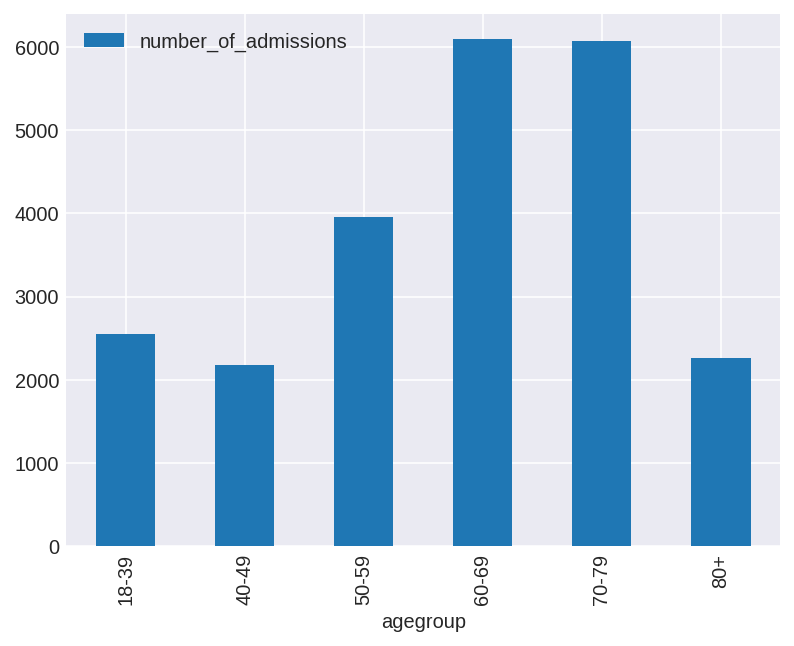

In [11]:
# modifies the pyplot back-end of Pandas to increase render resolution
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams["figure.dpi"] = 144

age_groups.plot(kind='bar', x='agegroup')

# Query AmsterdamUMCdb through pandas-gbq

The third option is to query the dataset using the Pandas `pandas-gbq` library. Especially when you are already familiar with the `pandas.read_sql` function, it's relatively straightforward to modify your existing code to be compatible with BigQuery. For more information, see [Pandas GBQ Documentation](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_gbq.html).


**Note**: The `use_bqstorage_api=True` statement enables the Google Cloud BigQuery Storage API that improves the performance of copying data from BiqQuery to pandas DataFrames in the Colab environment (~around 16 times). While the usage of the Storage Read API is being charged separately, Google currently offers a free tier of 300 TB per month. However, you may choose to remove the option from the command.

## Set the default query job configuration for pandas-gbq

In [ ]:
import pandas as pd

config_gbq = {'query': 
          {'defaultDataset': {
              "datasetId": DATASET_ID, 
              "projectId": DATASET_PROJECT_ID
              },
           'Location': LOCATION}
           }

## Retrieve the medical specialty associated with each admission

In [ ]:
specialties = pd.read_gbq(
    '''
    SELECT specialty, COUNT(*) AS number_of_admissions
    FROM admissions
    GROUP BY specialty
    ORDER BY number_of_admissions DESC 
    '''
    , configuration=config_gbq, use_bqstorage_api=True)
specialties.plot(kind='bar', x='specialty')

# Getting the data you need
The `amsterdamumcdb` package provides the `get_dictionary()` function that returns a DataFrame containing all `item`s and `itemid`s in AmsterdamUMCdb. In combination with BigQuery DataTables, it's possible to quickly locate an item of interest. Since AmsterdamUMCdb originated from a real Dutch ICU database, the original item names are in Dutch. For common ICU parameters, English translations have been provided as `item_en` and `category_en`. In addition, as part of the `ICUnity` project in preparation for the [The Dutch ICU Data Warehouse](https://www.icudata.nl/index-en.html) a number of commonly used items have been mapped to [LOINC](https://decor.nictiz.nl/art-decor/loinc), [SNOMED CT](https://decor.nictiz.nl/art-decor/snomed-ct) or [ATC](https://www.whocc.no/atc_ddd_index/) with data in the `vocabulary_id`, `vocabulary_concept_code`, `vocabulary_concept_name` columns. The mapping process is still very much work in progress, but we are happy to take [pull requests](https://github.com/AmsterdamUMC/AmsterdamUMCdb/pulls) for the [dictionary.csv](https://github.com/AmsterdamUMC/AmsterdamUMCdb/blob/master/amsterdamumcdb/dictionary/dictionary.csv) file, if you have any additions.

## Install the AmsterdamUMCdb package

In [6]:
# get the amsterdamumcdb package from PyPI repository for use in Colab
!pip install amsterdamumcdb
import amsterdamumcdb as adb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 273.5/273.5 kB 5.8 MB/s eta 0:00:00


## Load the AmsterdamUMCdb dictionary. 
Use the **Filter** button to quickly browse through the dictionary.

In [ ]:
dictionary = adb.get_dictionary()
dictionary

## Example: Mechanical ventilation: ventilation mode
There are different ways (modes) to mechanically ventilate patients. Patients that don't have any underlying breathing effort will be ventilated in a *control* mode. When patients recover (and sedative medication has been stopped or reduced) they will be ventilated in a *support* mode. Ventilation modes are documented as a categorical (list) value in the `listitems` table. The `listitems` table contains only validated data. Unvalidated device data (`registeredby IS NULL`) can be found in the `listitems_unvalidated` table. `listitems` have a `value` (text string) as wel as a `valueid`. Both are available from the dictionary.

More information on `listitems`: [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AmsterdamUMC/AmsterdamUMCdb/blob/master/tables/listitems.ipynb)

### Get itemids related to ventilation mode

In [ ]:
dictionary[dictionary['item_en'].str.contains(r'vent.*mode', regex=True, case=False).fillna(False)]

In [ ]:
ventmode = pd.read_gbq(
    '''
    SELECT
        admissionid
        , itemid
        , item
        , valueid
        , value
        , measuredat
        --, registeredat
        --, registeredby
        --, updatedat
        --, updatedby
    FROM listitems
    WHERE itemid IN (
        6685  --Type Beademing Evita 4
        , 9534  --Type beademing Evita
        , 12290  --Ventilatie Mode (Set) Servo-i ventilator
    )
    '''
    , configuration=config_gbq, use_bqstorage_api=True)

#show number of records in the dataframe
print(f'Number of ventilation mode values: {len(ventmode)}')

#show first 1000 items
ventmode.head(1000)

## Example: Mechanical ventilation: tidal volume (measurement or setting)
Tidal volume, the amount of air passed into and out of the lungs during one ventilation cycle ('artificial breath'), is an important parameter in mechanical ventilation. Together with `respiratory rate`, tidal volume determines minute ventilation (`minute ventilation` = `tidal volume` * `respiratory rate`). [A landmark trial](https://doi.org/10.1056/NEJM200005043421801) has shown that ventilating patients with 6 ml/kg ideal body weight (IBW) instead of 12 ml/kg IBW leads to better outcomes for patients with [Acute Respiratory Distress Syndrome (ARDS)](https://en.wikipedia.org/wiki/Acute_respiratory_distress_syndrome). Depending on the ventilation mode, the tidal volume may be set or will be determined by other parameters (e.g. pressure).

### Get itemids related to tidal volume

In [ ]:
dictionary[dictionary['item'].str.contains(r'teug|tidal', regex=True, case=False)]

### Get *validated* tidal volume values for all patients


In [ ]:
tidal_volume = pd.read_gbq(
    '''
    SELECT
        admissionid
        , itemid
        , value
        , measuredat
        --, registeredat
        , registeredby
        --, updatedat
        --, updatedby
        --, islabresult
    FROM numericitems --only validated values
    WHERE itemid IN (
        8851  --Tidal Volume (Set)
        , 9646  --Tidal Volume (set)(2)
        , 12275  --Exp. tidal volume
        , 12277  --Insp. tidal volume
        , 12291	--Teugvolume (Set)
        , 12358 --Exp. tidal volume (2)
        , 12360  --Insp. tidal volume (2)
    )
    '''
    , configuration=config_gbq, use_bqstorage_api=True)

#show number of records in the dataframe
print(f'Number of tidal volume values: {len(tidal_volume)}')

#show first 1000 items
tidal_volume.head(1000)

In [ ]:
adb.outliers_histogram(data=tidal_volume['value']).show()